# Instalacja oraz import niezbędnych bibliotek

In [1]:
!pip install datashader
!pip install holoviews hvplot colorcet
!pip install geoviews
!pip install pyspark

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 42.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.2/511.2 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.9/316.9 MB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.0-py2.py3-none-any.whl size=317425345 sha256=aaa90a7ef6f020c47faf65af79c64ebd237833605c81bf48191d756adc576bc8
  Stored in directory: /root/.cache/pip/wheels/41/4e/10/c2cf2467f71c678cfc8a6b9ac9241e5e44a01940da8fbb17fc
Successfully built pyspark


In [2]:
import pandas as pd
from pandas import DataFrame
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import KMeans
import copy
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import matplotlib as mpl
import datashader as ds
import datashader.transfer_functions as tf
import colorcet as cc
import holoviews as hv
from holoviews.operation.datashader import datashade
import geoviews as gv
import geoviews.tile_sources as gts
from holoviews import opts
from IPython.display import IFrame
from IPython.core.display import display
from bokeh.plotting import show, output_notebook
from sklearn import preprocessing
from sklearn.mixture import GaussianMixture
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, jaccard_score, recall_score, f1_score
import pickle
import seaborn as sns
from sklearn import tree
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif
from typing import Optional, Tuple, List
from imblearn.over_sampling import RandomOverSampler, SMOTE
from bokeh.layouts import row
from pyspark.sql.functions import col
from pyspark.sql.functions import size
from pyspark.sql import SparkSession
from pyspark.sql.types import IntegerType, FloatType, StringType, StructType
from pyspark.sql import Window
import pyspark
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb

# Załadowanie zbioru danych

In [3]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [4]:
!git clone https://github.com/PiotrMaciejKowalski/BigData2024Project.git

Cloning into 'BigData2024Project'...
remote: Enumerating objects: 1720, done.
remote: Counting objects: 100% (1066/1066), done.
remote: Compressing objects: 100% (523/523), done.
remote: Total 1720 (delta 698), reused 805 (delta 536), pack-reused 654
Receiving objects: 100% (1720/1720), 62.57 MiB | 7.63 MiB/s, done.
Resolving deltas: 100% (961/961), done.
Updating files: 100% (145/145), done.


In [5]:
!chmod 755 /content/BigData2024Project/src/setup.sh
!/content/BigData2024Project/src/setup.sh

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.0/236.0 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 514.7/514.7 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 453.8/453.8 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 306.6/306.6 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 29.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.9/468.9 kB 39.1 MB/s eta 0:00:00
  Attempting uninstall: platformdirs
    Found existing installation: platformdirs 4.1.0
    Uninstalling platformdirs-4.1.0:
      Successfully uninstalled platformdirs-4.1.0
  Attempting uninstall: keyring
    Found existing installation: keyring 23.5.0
    Uninstalli

In [6]:
import sys
sys.path.append('/content/BigData2024Project/src')

In [7]:
from start_spark import initialize_spark
initialize_spark()

In [8]:
from pyspark.sql import SparkSession
from big_mess.loaders import default_loader
from pyspark.sql import SparkSession, DataFrame as SparkDataFrame, functions as F

In [9]:
spark = SparkSession.builder\
        .master("local")\
        .appName("Colab")\
        .config('spark.ui.port', '4050')\
        .getOrCreate()

In [10]:
%%time
nasa = default_loader(spark)
nasa.show(5)

+---------+-------+-----+---------+---------+---------+--------------+----------+---------+----------+---------------+----+-----+
|      lon|    lat|Rainf|     Evap| AvgSurfT|   Albedo|SoilT_40_100cm|      GVEG|  PotEvap| RootMoist|SoilM_100_200cm|Year|Month|
+---------+-------+-----+---------+---------+---------+--------------+----------+---------+----------+---------------+----+-----+
|-112.0625|25.0625|  0.0|   4.3807| 288.0707| 41.47715|     289.00714|0.19712792|139.13737|  243.2525|      108.76931|2000|    1|
|-111.9375|25.0625|  0.0|4.6673994|287.39276|41.509407|      288.8017|0.19860405|162.25638| 220.77466|       90.67495|2000|    1|
|-111.8125|25.0625|  0.0|5.8487973| 287.6554|41.505375|     289.55984|0.17118543|121.55404| 103.95005|      161.94794|2000|    1|
|-111.6875|25.0625|  0.0|6.4366016| 287.5386|41.501343|     289.61142|0.17118543|127.63407|106.032845|      163.44402|2000|    1|
|-111.5625|25.0625|  0.0|3.4506986| 287.2394|41.509407|      289.2371| 0.1429876|179.37668

In [11]:
nasa.createOrReplaceTempView("nasa")

# Średnie wieloletnie dla poszczególnych miesięcy

In [12]:
def overYearMonthStats(columns: list, n: int):
    """
    Funkcja licząca średnie dla wybranych zmiennych dla danych współrzędnych geograficznych
    dla każdego z 12 miesięcy od roku w rozważanym pomiarze do n lat wstecz (tj. gdyby n=3, to
    średnia zostałaby wyliczona z rozważanego roku oraz 3 lat przed nim, czyli w praktyce mielibyśmy
    średnią z łącznie 4 lat).

    :param columns: lista nazw rozważanych kolumn ze zbioru danych
    :param n: liczba lat wstecz, z których chcemy wyliczyć średnią
    """

    if not columns:
      raise ValueError("Podana musi zostać co najmniej jedna zmienna")

    windowSpec = Window.partitionBy("lon", "lat", "Month").orderBy("Year").rowsBetween(-n, 0)

    nasa_window = nasa
    for column in columns:
        average_column_name = "monthly_avg_" + str(n) + "years_" + column
        nasa_window = nasa_window.withColumn(average_column_name, F.avg(F.col(column)).over(windowSpec))

    return nasa_window

Zastosujmy teraz powyższą funkcję na naszym datasecie, dla każdej z rozważanych kolumn pomiarowych, przyjmując n=3:

In [ ]:
columns_to_avg = ["Rainf", "Evap", "AvgSurfT", "Albedo", "SoilT_40_100cm", "GVEG", "PotEvap", "RootMoist", "SoilM_100_200cm"]

In [ ]:
result_df_3 = overYearMonthStats(columns_to_avg, n=3)
result_df_3.show(15)

+---------+-------+---------+---------+---------+---------+--------------+---------+---------+---------+---------------+----+-----+------------------------+-----------------------+---------------------------+-------------------------+---------------------------------+-----------------------+--------------------------+----------------------------+----------------------------------+
|      lon|    lat|    Rainf|     Evap| AvgSurfT|   Albedo|SoilT_40_100cm|     GVEG|  PotEvap|RootMoist|SoilM_100_200cm|Year|Month|monthly_avg_3years_Rainf|monthly_avg_3years_Evap|monthly_avg_3years_AvgSurfT|monthly_avg_3years_Albedo|monthly_avg_3years_SoilT_40_100cm|monthly_avg_3years_GVEG|monthly_avg_3years_PotEvap|monthly_avg_3years_RootMoist|monthly_avg_3years_SoilM_100_200cm|
+---------+-------+---------+---------+---------+---------+--------------+---------+---------+---------+---------------+----+-----+------------------------+-----------------------+---------------------------+------------------------

Wyodrębnijmy teraz kilka lat do oddzielnych dataframe'ów i zapiszmy je:

In [ ]:
# 2023
nasa_2023_monthly_avg_3 = result_df_3.filter(f'Year = {2023}')
pd_2023_monthly_avg_3 = nasa_2023_monthly_avg_3.toPandas()

In [ ]:
pd_2023_monthly_avg_3.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/3years/NASA_monthly_avg_2023.csv')

In [ ]:
# 2022
nasa_2022_monthly_avg_3 = result_df_3.filter(f'Year = {2022}')
pd_2022_monthly_avg_3 = nasa_2022_monthly_avg_3.toPandas()

In [ ]:
pd_2022_monthly_avg_3.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/3years/NASA_monthly_avg_2022.csv')

In [ ]:
# 2020
nasa_2020_monthly_avg_3 = result_df_3.filter(f'Year = {2020}')
pd_2020_monthly_avg_3 = nasa_2020_monthly_avg_3.toPandas()

In [ ]:
pd_2020_monthly_avg_3.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/3years/NASA_monthly_avg_2020.csv')

In [ ]:
# 2000
nasa_2000_monthly_avg_3 = result_df_3.filter(f'Year = {2000}')
pd_2000_monthly_avg_3 = nasa_2000_monthly_avg_3.toPandas()

In [ ]:
pd_2000_monthly_avg_3.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/3years/NASA_monthly_avg_2000.csv')

In [ ]:
# 1979
nasa_1979_monthly_avg_3 = result_df_3.filter(f'Year = {1979}')
pd_1979_monthly_avg_3 = nasa_1979_monthly_avg_3.toPandas()

In [ ]:
pd_1979_monthly_avg_3.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/3years/NASA_monthly_avg_1979.csv')

Teraz weźmy n=4:

In [ ]:
result_df_4 = overYearMonthStats(columns_to_avg, n=4)
result_df_4.show(15)

+---------+-------+---------+---------+---------+---------+--------------+---------+---------+---------+---------------+----+-----+------------------------+-----------------------+---------------------------+-------------------------+---------------------------------+-----------------------+--------------------------+----------------------------+----------------------------------+
|      lon|    lat|    Rainf|     Evap| AvgSurfT|   Albedo|SoilT_40_100cm|     GVEG|  PotEvap|RootMoist|SoilM_100_200cm|Year|Month|monthly_avg_4years_Rainf|monthly_avg_4years_Evap|monthly_avg_4years_AvgSurfT|monthly_avg_4years_Albedo|monthly_avg_4years_SoilT_40_100cm|monthly_avg_4years_GVEG|monthly_avg_4years_PotEvap|monthly_avg_4years_RootMoist|monthly_avg_4years_SoilM_100_200cm|
+---------+-------+---------+---------+---------+---------+--------------+---------+---------+---------+---------------+----+-----+------------------------+-----------------------+---------------------------+------------------------

In [ ]:
# 2023
nasa_2023_monthly_avg_4 = result_df_4.filter(f'Year = {2023}')
pd_2023_monthly_avg_4 = nasa_2023_monthly_avg_4.toPandas()

In [ ]:
pd_2023_monthly_avg_4.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/4years/NASA_monthly_avg_2023.csv')

In [ ]:
# 2022
nasa_2022_monthly_avg_4 = result_df_4.filter(f'Year = {2022}')
pd_2022_monthly_avg_4 = nasa_2022_monthly_avg_4.toPandas()

In [ ]:
pd_2022_monthly_avg_4.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/4years/NASA_monthly_avg_2022.csv')

In [ ]:
# 2020
nasa_2020_monthly_avg_4 = result_df_4.filter(f'Year = {2020}')
pd_2020_monthly_avg_4 = nasa_2020_monthly_avg_4.toPandas()

In [ ]:
pd_2020_monthly_avg_4.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/4years/NASA_monthly_avg_2020.csv')

In [ ]:
# 2000
nasa_2000_monthly_avg_4 = result_df_4.filter(f'Year = {2000}')
pd_2000_monthly_avg_4 = nasa_2000_monthly_avg_4.toPandas()

In [ ]:
pd_2000_monthly_avg_4.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/4years/NASA_monthly_avg_2000.csv')

In [ ]:
# 1979
nasa_1979_monthly_avg_4 = result_df_4.filter(f'Year = {1979}')
pd_1979_monthly_avg_4 = nasa_1979_monthly_avg_4.toPandas()

In [ ]:
pd_1979_monthly_avg_4.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/4years/NASA_monthly_avg_1979.csv')

n=5:

In [ ]:
result_df_5 = overYearMonthStats(columns_to_avg, n=5)
result_df_5.show(15)

+---------+-------+---------+---------+---------+---------+--------------+---------+---------+---------+---------------+----+-----+------------------------+-----------------------+---------------------------+-------------------------+---------------------------------+-----------------------+--------------------------+----------------------------+----------------------------------+
|      lon|    lat|    Rainf|     Evap| AvgSurfT|   Albedo|SoilT_40_100cm|     GVEG|  PotEvap|RootMoist|SoilM_100_200cm|Year|Month|monthly_avg_5years_Rainf|monthly_avg_5years_Evap|monthly_avg_5years_AvgSurfT|monthly_avg_5years_Albedo|monthly_avg_5years_SoilT_40_100cm|monthly_avg_5years_GVEG|monthly_avg_5years_PotEvap|monthly_avg_5years_RootMoist|monthly_avg_5years_SoilM_100_200cm|
+---------+-------+---------+---------+---------+---------+--------------+---------+---------+---------+---------------+----+-----+------------------------+-----------------------+---------------------------+------------------------

In [ ]:
# 2023
nasa_2023_monthly_avg_5 = result_df_5.filter(f'Year = {2023}')
pd_2023_monthly_avg_5 = nasa_2023_monthly_avg_5.toPandas()

In [ ]:
pd_2023_monthly_avg_5.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/5years/NASA_monthly_avg_2023.csv')

In [ ]:
# 2022
nasa_2022_monthly_avg_5 = result_df_5.filter(f'Year = {2022}')
pd_2022_monthly_avg_5 = nasa_2022_monthly_avg_5.toPandas()

In [ ]:
pd_2022_monthly_avg_5.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/5years/NASA_monthly_avg_2022.csv')

In [ ]:
# 2020
nasa_2020_monthly_avg_5 = result_df_5.filter(f'Year = {2020}')
pd_2020_monthly_avg_5 = nasa_2020_monthly_avg_5.toPandas()

In [ ]:
pd_2020_monthly_avg_5.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/5years/NASA_monthly_avg_2020.csv')

In [ ]:
# 2000
nasa_2000_monthly_avg_5 = result_df_5.filter(f'Year = {2000}')
pd_2000_monthly_avg_5 = nasa_2000_monthly_avg_5.toPandas()

In [ ]:
pd_2000_monthly_avg_5.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/5years/NASA_monthly_avg_2000.csv')

In [ ]:
# 1979
nasa_1979_monthly_avg_5 = result_df_5.filter(f'Year = {1979}')
pd_1979_monthly_avg_5 = nasa_1979_monthly_avg_5.toPandas()

In [ ]:
pd_1979_monthly_avg_5.to_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/5years/NASA_monthly_avg_1979.csv')

# Dane do modeli

Zbiór anotowany:

In [15]:
NASA_sample_an = pd.read_csv('/content/drive/MyDrive/BigMess/NASA/NASA_an.csv', sep=';')

In [16]:
NASA_sample_an

,lon,lat,pustynia,step
0,-98.4375,49.0625,0,0
1,-84.4375,51.9375,0,0
2,-100.5625,47.0625,0,0
3,-104.6875,48.8125,0,0
4,-95.1875,36.5625,0,0
...,...,...,...,...
1190,-108.0625,42.8125,0,0
1191,-103.1875,51.5625,0,0
1192,-88.8125,51.5625,0,0
1193,-120.5625,51.3125,0,0


## Średnie 3-letnie

In [17]:
pd_2023_monthly_avg_3 = pd.read_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/3years/NASA_monthly_avg_2023.csv')
del pd_2023_monthly_avg_3[pd_2023_monthly_avg_3.columns[0]]

In [18]:
monthly_avg_3_july2023 = pd_2023_monthly_avg_3[pd_2023_monthly_avg_3['Month'] == 7]

In [19]:
monthly_avg_3_july2023

,lon,lat,Rainf,Evap,AvgSurfT,Albedo,SoilT_40_100cm,GVEG,PotEvap,RootMoist,...,Month,monthly_avg_3years_Rainf,monthly_avg_3years_Evap,monthly_avg_3years_AvgSurfT,monthly_avg_3years_Albedo,monthly_avg_3years_SoilT_40_100cm,monthly_avg_3years_GVEG,monthly_avg_3years_PotEvap,monthly_avg_3years_RootMoist,monthly_avg_3years_SoilM_100_200cm
7,-124.9375,52.5625,80.639610,51.97407,285.7022,21.08737,278.1080,0.604443,238.6102,540.4921,...,7,50.972182,40.194422,284.982887,21.100472,275.615448,0.604848,229.196804,583.480606,324.904984
19,-124.5625,49.0625,25.480200,51.37409,286.7776,19.38710,283.0983,0.893853,247.7870,398.4455,...,7,23.390900,49.995727,286.705093,19.396507,282.590195,0.893975,224.724850,427.990448,220.871300
36,-124.3125,42.1875,0.506200,29.13482,288.0354,20.89919,282.3199,0.933880,273.7310,507.0720,...,7,2.699650,30.789985,288.036896,21.699260,282.454498,0.933839,259.536800,535.882027,272.966293
38,-124.3125,47.4375,9.153201,31.84522,288.0103,20.89919,283.5746,0.908697,219.5639,508.7874,...,7,4.015450,28.521708,288.084557,20.907256,283.559616,0.908738,198.910927,524.743652,268.653366
61,-124.1875,51.4375,42.854110,36.93749,286.5356,20.81989,279.0159,0.540914,251.0063,476.7172,...,7,26.306938,28.168294,285.226875,20.831317,275.748604,0.541197,241.008579,536.086021,300.883476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
684527,-67.3125,45.5625,56.803700,60.21579,294.7704,23.04032,284.5703,0.867402,199.0822,484.4030,...,7,43.461270,49.075274,293.257423,23.047040,282.651627,0.867483,213.453098,484.642525,244.790550
684538,-67.3125,50.8125,208.043900,97.60188,292.3833,19.33737,284.1961,0.632582,221.1933,503.2397,...,7,163.997751,69.554985,290.072052,19.345770,280.639023,0.632582,233.664925,510.860329,261.894051
684548,-67.1875,46.8125,136.331700,54.90945,293.9326,23.46640,279.7365,0.946114,194.1583,607.9186,...,7,110.970955,46.894572,291.816574,23.475135,279.681480,0.946235,199.607048,593.766388,318.140427
684549,-67.1875,47.5625,125.029600,69.68864,293.8942,21.57124,280.4048,0.958282,199.9529,555.9119,...,7,118.213076,66.167583,291.495422,21.577960,280.301270,0.958477,206.651299,546.918350,277.187553


In [20]:
monthly_avg_3_july2023_an_merge = pd_2023_monthly_avg_3.merge(NASA_sample_an, left_on=['lon','lat'], right_on=['lon','lat'], how='inner')
monthly_avg_3_july2023_an_merge

,lon,lat,Rainf,Evap,AvgSurfT,Albedo,SoilT_40_100cm,GVEG,PotEvap,RootMoist,...,monthly_avg_3years_Evap,monthly_avg_3years_AvgSurfT,monthly_avg_3years_Albedo,monthly_avg_3years_SoilT_40_100cm,monthly_avg_3years_GVEG,monthly_avg_3years_PotEvap,monthly_avg_3years_RootMoist,monthly_avg_3years_SoilM_100_200cm,pustynia,step
0,-124.3125,47.9375,22.84259,31.94241,284.6806,18.03898,280.4269,0.785416,202.50610,529.0699,...,43.459158,283.292778,18.049730,280.135376,0.786602,172.287201,554.276245,283.456352,0,0
1,-124.3125,47.9375,41.39550,30.43762,286.7495,20.40591,283.2495,0.920000,197.21250,464.3071,...,30.878875,287.018806,20.415320,283.309494,0.920000,186.289150,495.562340,254.051472,0,0
2,-124.3125,47.9375,347.93600,18.44930,277.1200,18.86962,277.9659,0.521006,38.44287,609.9357,...,21.039155,276.850327,19.222107,278.038246,0.521006,38.629360,619.410660,317.656044,0,0
3,-124.3125,47.9375,146.86010,30.37550,284.5539,20.46667,284.4813,0.824866,125.19230,476.9010,...,31.131513,285.047523,20.460419,284.480225,0.823626,129.890076,488.111328,242.837425,0,0
4,-124.3125,47.9375,337.49410,25.50499,276.3264,18.59970,277.4910,0.577188,54.58794,599.3296,...,22.333875,276.198997,18.393691,277.472801,0.577341,55.437480,596.306519,304.901695,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10741,-79.9375,34.6875,90.05460,25.88060,283.8054,21.61309,282.7571,0.364972,133.81580,472.5803,...,24.455088,282.081726,21.612130,281.959854,0.365102,122.446249,461.104904,250.232494,0,0
10742,-79.9375,34.6875,118.12130,141.74510,302.4879,25.31586,297.5802,0.619985,315.24590,370.0426,...,141.183426,302.051361,25.322580,297.788925,0.620065,319.983528,351.037354,162.335323,0,0
10743,-79.9375,34.6875,58.99700,103.67730,295.9980,24.53472,298.2621,0.641585,238.22940,359.7611,...,94.380224,296.094795,24.530207,298.320374,0.641460,242.028549,317.539024,130.819931,0,0
10744,-79.9375,34.6875,129.06920,126.05990,297.7621,24.24167,293.2474,0.613774,307.96540,378.5096,...,123.902876,298.847794,24.248960,294.302620,0.613732,315.648727,370.722298,189.279930,0,0


Zostawimy tylko kolumny ze współrzędnymi, ze średnimi oraz kolumnę 'pustynia' ograniczając się jedynie do stwierdzenia czy dana lokalizacja jest pustynią czy nie.

In [21]:
# zostawiamy kolumny 'lon', 'lat', 'pustynia' oraz kolumny, których nazwy zaczynają się od "monthly_avg"
columns_to_leave = ['lon', 'lat', 'pustynia'] + [col for col in monthly_avg_3_july2023_an_merge.columns if col.startswith('monthly_avg')]
monthly_avg_3_july2023_an_merge = monthly_avg_3_july2023_an_merge[columns_to_leave]

In [22]:
monthly_avg_3_july2023_an_merge

,lon,lat,pustynia,monthly_avg_3years_Rainf,monthly_avg_3years_Evap,monthly_avg_3years_AvgSurfT,monthly_avg_3years_Albedo,monthly_avg_3years_SoilT_40_100cm,monthly_avg_3years_GVEG,monthly_avg_3years_PotEvap,monthly_avg_3years_RootMoist,monthly_avg_3years_SoilM_100_200cm
0,-124.3125,47.9375,0,120.625044,43.459158,283.292778,18.049730,280.135376,0.786602,172.287201,554.276245,283.456352
1,-124.3125,47.9375,0,22.534875,30.878875,287.018806,20.415320,283.309494,0.920000,186.289150,495.562340,254.051472
2,-124.3125,47.9375,0,518.693924,21.039155,276.850327,19.222107,278.038246,0.521006,38.629360,619.410660,317.656044
3,-124.3125,47.9375,0,138.388131,31.131513,285.047523,20.460419,284.480225,0.823626,129.890076,488.111328,242.837425
4,-124.3125,47.9375,0,302.459953,22.333875,276.198997,18.393691,277.472801,0.577341,55.437480,596.306519,304.901695
...,...,...,...,...,...,...,...,...,...,...,...,...
10741,-79.9375,34.6875,0,111.380352,24.455088,282.081726,21.612130,281.959854,0.365102,122.446249,461.104904,250.232494
10742,-79.9375,34.6875,0,136.206350,141.183426,302.051361,25.322580,297.788925,0.620065,319.983528,351.037354,162.335323
10743,-79.9375,34.6875,0,122.266251,94.380224,296.094795,24.530207,298.320374,0.641460,242.028549,317.539024,130.819931
10744,-79.9375,34.6875,0,102.134250,123.902876,298.847794,24.248960,294.302620,0.613732,315.648727,370.722298,189.279930


## Średnie 4-letnie

In [23]:
pd_2023_monthly_avg_4 = pd.read_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/4years/NASA_monthly_avg_2023.csv')
del pd_2023_monthly_avg_4[pd_2023_monthly_avg_4.columns[0]]

In [24]:
monthly_avg_4_july2023 = pd_2023_monthly_avg_4[pd_2023_monthly_avg_4['Month'] == 7]

In [25]:
monthly_avg_4_july2023

,lon,lat,Rainf,Evap,AvgSurfT,Albedo,SoilT_40_100cm,GVEG,PotEvap,RootMoist,...,Month,monthly_avg_4years_Rainf,monthly_avg_4years_Evap,monthly_avg_4years_AvgSurfT,monthly_avg_4years_Albedo,monthly_avg_4years_SoilT_40_100cm,monthly_avg_4years_GVEG,monthly_avg_4years_PotEvap,monthly_avg_4years_RootMoist,monthly_avg_4years_SoilM_100_200cm
7,-124.9375,52.5625,80.639610,51.97407,285.7022,21.08737,278.1080,0.604443,238.6102,540.4921,...,7,68.075567,45.607785,284.790167,21.097582,275.883240,0.604767,222.779562,587.221680,326.244067
19,-124.5625,49.0625,25.480200,51.37409,286.7776,19.38710,283.0983,0.893853,247.7870,398.4455,...,7,27.285676,50.852037,286.648297,19.394894,282.635577,0.893950,221.570319,424.512878,218.204120
36,-124.3125,42.1875,0.506200,29.13482,288.0354,20.89919,282.3199,0.933880,273.7310,507.0720,...,7,2.465760,30.309112,288.052997,21.750268,282.496997,0.933847,258.322641,531.420880,270.603992
38,-124.3125,47.4375,9.153201,31.84522,288.0103,20.89919,283.5746,0.908697,219.5639,508.7874,...,7,5.558160,29.033108,288.238824,20.905643,283.631293,0.908730,197.356342,519.427240,265.537033
61,-124.1875,51.4375,42.854110,36.93749,286.5356,20.81989,279.0159,0.540914,251.0063,476.7172,...,7,40.613181,33.491591,285.165619,20.829032,276.054926,0.541140,235.190744,539.742181,303.774103
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
684527,-67.3125,45.5625,56.803700,60.21579,294.7704,23.04032,284.5703,0.867402,199.0822,484.4030,...,7,40.838058,46.330315,293.252539,23.045695,282.084003,0.867467,214.556918,491.157758,249.053522
684538,-67.3125,50.8125,208.043900,97.60188,292.3833,19.33737,284.1961,0.632582,221.1933,503.2397,...,7,149.204451,67.020152,290.024200,19.344090,280.337396,0.632582,239.534277,509.003961,262.461218
684548,-67.1875,46.8125,136.331700,54.90945,293.9326,23.46640,279.7365,0.946114,194.1583,607.9186,...,7,103.601648,47.332872,291.746820,23.473388,279.728766,0.946211,201.951657,591.298975,316.535919
684549,-67.1875,47.5625,125.029600,69.68864,293.8942,21.57124,280.4048,0.958282,199.9529,555.9119,...,7,113.943146,63.915150,291.401239,21.576616,280.008398,0.958438,209.178699,546.810156,277.479584


In [26]:
monthly_avg_4_july2023_an_merge = pd_2023_monthly_avg_4.merge(NASA_sample_an, left_on=['lon','lat'], right_on=['lon','lat'], how='inner')
monthly_avg_4_july2023_an_merge

,lon,lat,Rainf,Evap,AvgSurfT,Albedo,SoilT_40_100cm,GVEG,PotEvap,RootMoist,...,monthly_avg_4years_Evap,monthly_avg_4years_AvgSurfT,monthly_avg_4years_Albedo,monthly_avg_4years_SoilT_40_100cm,monthly_avg_4years_GVEG,monthly_avg_4years_PotEvap,monthly_avg_4years_RootMoist,monthly_avg_4years_SoilM_100_200cm,pustynia,step
0,-124.3125,47.9375,22.84259,31.94241,284.6806,18.03898,280.4269,0.785416,202.50610,529.0699,...,40.992664,283.574200,18.047580,280.255902,0.786365,177.340500,548.181812,280.850360,0,0
1,-124.3125,47.9375,41.39550,30.43762,286.7495,20.40591,283.2495,0.920000,197.21250,464.3071,...,32.701038,287.213947,20.413438,283.409576,0.920000,184.810181,495.799054,252.677298,0,0
2,-124.3125,47.9375,347.93600,18.44930,277.1200,18.86962,277.9659,0.521006,38.44287,609.9357,...,19.841506,276.873083,18.800536,278.154095,0.521006,38.424532,618.046912,317.277997,0,0
3,-124.3125,47.9375,146.86010,30.37550,284.5539,20.46667,284.4813,0.824866,125.19230,476.9010,...,32.321686,285.134381,20.461669,284.612640,0.823874,126.518541,497.708826,247.708679,0,0
4,-124.3125,47.9375,337.49410,25.50499,276.3264,18.59970,277.4910,0.577188,54.58794,599.3296,...,22.748578,275.628955,18.592036,277.346222,0.577310,56.152216,592.800830,302.926318,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10741,-79.9375,34.6875,90.05460,25.88060,283.8054,21.61309,282.7571,0.364972,133.81580,472.5803,...,24.620710,282.296082,21.612322,282.118402,0.365076,121.118399,458.688422,250.161017,0,0
10742,-79.9375,34.6875,118.12130,141.74510,302.4879,25.31586,297.5802,0.619985,315.24590,370.0426,...,139.546780,302.139709,25.321236,297.947601,0.620049,326.449005,343.190161,157.398560,0,0
10743,-79.9375,34.6875,58.99700,103.67730,295.9980,24.53472,298.2621,0.641585,238.22940,359.7611,...,92.840430,296.715619,24.531110,298.511877,0.641485,254.232800,302.692719,119.960715,0,0
10744,-79.9375,34.6875,129.06920,126.05990,297.7621,24.24167,293.2474,0.613774,307.96540,378.5096,...,122.806921,298.856512,24.247503,294.423016,0.613741,314.671539,366.252997,186.875723,0,0


Zostawimy tylko kolumny ze współrzędnymi, ze średnimi oraz kolumnę 'pustynia' ograniczając się jedynie do stwierdzenia czy dana lokalizacja jest pustynią czy nie.

In [27]:
# zostawiamy kolumny 'lon', 'lat', 'pustynia' oraz kolumny, których nazwy zaczynają się od "monthly_avg"
columns_to_leave = ['lon', 'lat', 'pustynia'] + [col for col in monthly_avg_4_july2023_an_merge.columns if col.startswith('monthly_avg')]
monthly_avg_4_july2023_an_merge = monthly_avg_4_july2023_an_merge[columns_to_leave]

In [28]:
monthly_avg_4_july2023_an_merge

,lon,lat,pustynia,monthly_avg_4years_Rainf,monthly_avg_4years_Evap,monthly_avg_4years_AvgSurfT,monthly_avg_4years_Albedo,monthly_avg_4years_SoilT_40_100cm,monthly_avg_4years_GVEG,monthly_avg_4years_PotEvap,monthly_avg_4years_RootMoist,monthly_avg_4years_SoilM_100_200cm
0,-124.3125,47.9375,0,103.423153,40.992664,283.574200,18.047580,280.255902,0.786365,177.340500,548.181812,280.850360
1,-124.3125,47.9375,0,30.404060,32.701038,287.213947,20.413438,283.409576,0.920000,184.810181,495.799054,252.677298
2,-124.3125,47.9375,0,496.864240,19.841506,276.873083,18.800536,278.154095,0.521006,38.424532,618.046912,317.277997
3,-124.3125,47.9375,0,149.701484,32.321686,285.134381,20.461669,284.612640,0.823874,126.518541,497.708826,247.708679
4,-124.3125,47.9375,0,275.156863,22.748578,275.628955,18.592036,277.346222,0.577310,56.152216,592.800830,302.926318
...,...,...,...,...,...,...,...,...,...,...,...,...
10741,-79.9375,34.6875,0,100.743307,24.620710,282.296082,21.612322,282.118402,0.365076,121.118399,458.688422,250.161017
10742,-79.9375,34.6875,0,130.550380,139.546780,302.139709,25.321236,297.947601,0.620049,326.449005,343.190161,157.398560
10743,-79.9375,34.6875,0,107.219279,92.840430,296.715619,24.531110,298.511877,0.641485,254.232800,302.692719,119.960715
10744,-79.9375,34.6875,0,99.694402,122.806921,298.856512,24.247503,294.423016,0.613741,314.671539,366.252997,186.875723


## Średnie 5-letnie

In [29]:
pd_2023_monthly_avg_5 = pd.read_csv('/content/drive/MyDrive/BigMess/NASA/monthly_avg/5years/NASA_monthly_avg_2023.csv')
del pd_2023_monthly_avg_5[pd_2023_monthly_avg_5.columns[0]]

In [30]:
monthly_avg_5_july2023 = pd_2023_monthly_avg_5[pd_2023_monthly_avg_5['Month'] == 7]

In [31]:
monthly_avg_5_july2023

,lon,lat,Rainf,Evap,AvgSurfT,Albedo,SoilT_40_100cm,GVEG,PotEvap,RootMoist,...,Month,monthly_avg_5years_Rainf,monthly_avg_5years_Evap,monthly_avg_5years_AvgSurfT,monthly_avg_5years_Albedo,monthly_avg_5years_SoilT_40_100cm,monthly_avg_5years_GVEG,monthly_avg_5years_PotEvap,monthly_avg_5years_RootMoist,monthly_avg_5years_SoilM_100_200cm
7,-124.9375,52.5625,80.639610,51.97407,285.7022,21.08737,278.1080,0.604443,238.6102,540.4921,...,7,65.748652,45.356734,284.935308,21.096552,276.048350,0.604713,225.499985,585.284312,325.513204
19,-124.5625,49.0625,25.480200,51.37409,286.7776,19.38710,283.0983,0.893853,247.7870,398.4455,...,7,26.388232,52.448338,286.919017,19.393595,282.709564,0.893934,227.702098,422.663584,216.659782
36,-124.3125,42.1875,0.506200,29.13482,288.0354,20.89919,282.3199,0.933880,273.7310,507.0720,...,7,2.106667,30.859012,288.157613,21.784273,282.546712,0.933853,263.031970,527.530568,268.549093
38,-124.3125,47.4375,9.153201,31.84522,288.0103,20.89919,283.5746,0.908697,219.5639,508.7874,...,7,4.911267,29.704160,288.340535,20.904567,283.675079,0.908724,200.449768,519.360804,265.513293
61,-124.1875,51.4375,42.854110,36.93749,286.5356,20.81989,279.0159,0.540914,251.0063,476.7172,...,7,39.078885,33.883143,285.426732,20.827508,276.329870,0.541103,238.555171,532.754969,298.881638
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
684527,-67.3125,45.5625,56.803700,60.21579,294.7704,23.04032,284.5703,0.867402,199.0822,484.4030,...,7,38.246948,46.663873,293.358597,23.044799,282.095235,0.867456,217.695681,492.176463,249.591151
684538,-67.3125,50.8125,208.043900,97.60188,292.3833,19.33737,284.1961,0.632582,221.1933,503.2397,...,7,153.048626,67.703453,290.195384,19.342970,280.310232,0.632582,241.088331,507.529099,260.999400
684548,-67.1875,46.8125,136.331700,54.90945,293.9326,23.46640,279.7365,0.946114,194.1583,607.9186,...,7,98.020943,45.382405,291.994181,23.472224,279.461207,0.946195,206.157115,590.839732,316.566849
684549,-67.1875,47.5625,125.029600,69.68864,293.8942,21.57124,280.4048,0.958282,199.9529,555.9119,...,7,112.561288,61.597771,291.689718,21.575720,279.746501,0.958412,213.880981,546.370585,277.640818


In [32]:
monthly_avg_5_july2023_an_merge = pd_2023_monthly_avg_5.merge(NASA_sample_an, left_on=['lon','lat'], right_on=['lon','lat'], how='inner')
monthly_avg_5_july2023_an_merge

,lon,lat,Rainf,Evap,AvgSurfT,Albedo,SoilT_40_100cm,GVEG,PotEvap,RootMoist,...,monthly_avg_5years_Evap,monthly_avg_5years_AvgSurfT,monthly_avg_5years_Albedo,monthly_avg_5years_SoilT_40_100cm,monthly_avg_5years_GVEG,monthly_avg_5years_PotEvap,monthly_avg_5years_RootMoist,monthly_avg_5years_SoilM_100_200cm,pustynia,step
0,-124.3125,47.9375,22.84259,31.94241,284.6806,18.03898,280.4269,0.785416,202.50610,529.0699,...,39.152852,283.776515,18.046147,280.375534,0.786207,179.996399,545.237905,279.632685,0,0
1,-124.3125,47.9375,41.39550,30.43762,286.7495,20.40591,283.2495,0.920000,197.21250,464.3071,...,33.923532,287.281957,20.412184,283.450033,0.920000,187.665151,497.627014,253.717379,0,0
2,-124.3125,47.9375,347.93600,18.44930,277.1200,18.86962,277.9659,0.521006,38.44287,609.9357,...,20.307939,276.990789,18.738798,278.117132,0.521006,38.035025,619.641978,317.781662,0,0
3,-124.3125,47.9375,146.86010,30.37550,284.5539,20.46667,284.4813,0.824866,125.19230,476.9010,...,33.313453,284.994370,20.442594,284.561498,0.824039,124.365501,502.235168,249.683716,0,0
4,-124.3125,47.9375,337.49410,25.50499,276.3264,18.59970,277.4910,0.577188,54.58794,599.3296,...,23.041500,275.686198,18.178135,277.427383,0.577290,56.838135,592.860057,303.260198,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10741,-79.9375,34.6875,90.05460,25.88060,283.8054,21.61309,282.7571,0.364972,133.81580,472.5803,...,24.471177,282.886403,21.612450,282.184916,0.365059,124.295148,456.420949,249.129163,0,0
10742,-79.9375,34.6875,118.12130,141.74510,302.4879,25.31586,297.5802,0.619985,315.24590,370.0426,...,139.370468,302.129908,25.320340,298.125432,0.620039,328.507222,344.551387,157.686200,0,0
10743,-79.9375,34.6875,58.99700,103.67730,295.9980,24.53472,298.2621,0.641585,238.22940,359.7611,...,93.721685,297.264165,24.531711,298.656067,0.641502,248.156166,320.463430,136.489512,0,0
10744,-79.9375,34.6875,129.06920,126.05990,297.7621,24.24167,293.2474,0.613774,307.96540,378.5096,...,124.606552,299.295461,24.246531,294.643565,0.613746,318.522151,366.731649,186.657969,0,0


Zostawimy tylko kolumny ze współrzędnymi, ze średnimi oraz kolumnę 'pustynia' ograniczając się jedynie do stwierdzenia czy dana lokalizacja jest pustynią czy nie.

In [33]:
# zostawiamy kolumny 'lon', 'lat', 'pustynia' oraz kolumny, których nazwy zaczynają się od "monthly_avg"
columns_to_leave = ['lon', 'lat', 'pustynia'] + [col for col in monthly_avg_5_july2023_an_merge.columns if col.startswith('monthly_avg')]
monthly_avg_5_july2023_an_merge = monthly_avg_5_july2023_an_merge[columns_to_leave]

In [34]:
monthly_avg_5_july2023_an_merge

,lon,lat,pustynia,monthly_avg_5years_Rainf,monthly_avg_5years_Evap,monthly_avg_5years_AvgSurfT,monthly_avg_5years_Albedo,monthly_avg_5years_SoilT_40_100cm,monthly_avg_5years_GVEG,monthly_avg_5years_PotEvap,monthly_avg_5years_RootMoist,monthly_avg_5years_SoilM_100_200cm
0,-124.3125,47.9375,0,90.823026,39.152852,283.776515,18.046147,280.375534,0.786207,179.996399,545.237905,279.632685
1,-124.3125,47.9375,0,28.624350,33.923532,287.281957,20.412184,283.450033,0.920000,187.665151,497.627014,253.717379
2,-124.3125,47.9375,0,516.178197,20.307939,276.990789,18.738798,278.117132,0.521006,38.035025,619.641978,317.781662
3,-124.3125,47.9375,0,154.730769,33.313453,284.994370,20.442594,284.561498,0.824039,124.365501,502.235168,249.683716
4,-124.3125,47.9375,0,264.247086,23.041500,275.686198,18.178135,277.427383,0.577290,56.838135,592.860057,303.260198
...,...,...,...,...,...,...,...,...,...,...,...,...
10741,-79.9375,34.6875,0,90.999608,24.471177,282.886403,21.612450,282.184916,0.365059,124.295148,456.420949,249.129163
10742,-79.9375,34.6875,0,134.216450,139.370468,302.129908,25.320340,298.125432,0.620039,328.507222,344.551387,157.686200
10743,-79.9375,34.6875,0,163.372063,93.721685,297.264165,24.531711,298.656067,0.641502,248.156166,320.463430,136.489512
10744,-79.9375,34.6875,0,102.268169,124.606552,299.295461,24.246531,294.643565,0.613746,318.522151,366.731649,186.657969


## Funkcje

In [35]:
# balansowanie zbioru danych z notatnika Rafała
class BalanceDataSet():
  '''
  Two techniques for handling imbalanced data.
  '''
  def __init__(
      self,
      X: DataFrame,
      y: DataFrame
      ) -> None:
      self.X = X
      self.y = y
      assert len(self.X)==len(self.y)

  def useOverSampling(
      self,
      randon_seed: Optional[int] = 2023
      ) -> Tuple[DataFrame, DataFrame]:
    oversample = RandomOverSampler( sampling_strategy='auto',
                  random_state=randon_seed)
    return oversample.fit_resample(self.X, self.y)

  def useSMOTE(
      self,
      randon_seed: Optional[int] = 2023
      ) -> Tuple[DataFrame, DataFrame]:
    smote = SMOTE(random_state=randon_seed)
    return smote.fit_resample(self.X, self.y)

In [36]:
def summary_model(model, X:pd.DataFrame, y:pd.DataFrame, labels_names: List) -> None:
  y_pred = model.predict(X)
  y_real= y
  cf_matrix = confusion_matrix(y_real, y_pred)
  group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
  group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
  labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_counts,group_percentages)]
  labels = np.asarray(labels).reshape(len(labels_names),len(labels_names))
  sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Reds',xticklabels=labels_names,yticklabels=labels_names)
  plt.xlabel('Predykcja')
  plt.ylabel('Rzeczywistość')
  plt.show()

In [37]:
def print_classification_report(model, X: pd.DataFrame, y: pd.DataFrame) -> None:
  y_predict = model.predict(X)
  print(classification_report(y, y_predict))

In [38]:
def show_metrics(model, X: pd.DataFrame, y: pd.DataFrame) -> None:
  y_pred = model.predict(X)
#  print("Macierz błędu\n", confusion_matrix(y_true, y_pred), "\n")
  accuracy = accuracy_score(y, y_pred)
  print(f"Dokładność (accuracy): {accuracy*100:.2f}%")
  precision = precision_score(y, y_pred)
  print(f"Precyzja (precision): {precision*100:.2f}%")
  recall = recall_score(y, y_pred)
  print(f"Czułość (recall): {recall*100:.2f}%")
  f1 = f1_score(y, y_pred)
  print(f"F1-score: {f1*100:.2f}%")

In [39]:
def plot_map(df: pd.DataFrame, parameter_name: str, colormap: mpl.colors.LinearSegmentedColormap,
             title: str, point_size: int = 8, width: int = 900, height: int = 600, alpha: float = 1,
             bgcolor: str = 'white'):

    gdf = gv.Points(df, ['lon', 'lat'], [parameter_name]) # obiekt zawierający punkty
    tiles = gts.OSM # wybór mapy tła, w tym wypadku OpenStreetMap

    # łączenie mapy tła z punktami i ustawienie wybranych parametrów wizualizacji
    map_with_points = tiles * gdf.opts(
        title=title,
        color=parameter_name,
        cmap=colormap,
        size=point_size,
        width=width,
        height=height,
        colorbar=True,
        toolbar='above',
        tools=['hover', 'wheel_zoom', 'reset'],
        alpha=alpha, # przezroczystość
        bgcolor=bgcolor
    )

    map_with_points.opts(bgcolor=bgcolor)

#    # zapis mapy do pliku .html
#    output_filename = f'/content/drive/MyDrive/BigMess/NASA/output_map_{parameter_name}.html'
#    hv.save(map_with_points, output_filename)

    return hv.render(map_with_points)

# Las losowy

## Trening i test modelu przy użyciu nowych danych i zbioru anotowanego

### Średnie 3-letnie

In [40]:
X = monthly_avg_3_july2023_an_merge.drop(columns=['lon', 'lat', 'pustynia'])
y = monthly_avg_3_july2023_an_merge['pustynia']

In [41]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [42]:
rf_monthly_avg_3_july2023 = RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70, random_state=3)

In [43]:
rf_monthly_avg_3_july2023.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70,
                       random_state=3)

Zastosujmy model na pełnych danych:

In [44]:
monthly_avg_3_july2023_pred = monthly_avg_3_july2023.copy()
monthly_avg_3_july2023_pred['pustynia'] = rf_monthly_avg_3_july2023.predict(monthly_avg_3_july2023.loc[:, [col for col in monthly_avg_3_july2023.columns if col.startswith('monthly_avg')]])

In [45]:
output_notebook()
show(plot_map(df=monthly_avg_3_july2023_pred, parameter_name='pustynia',
              colormap=dict(zip(['1', '0'], ['yellow', 'green'])),
              title='Pustynie (1) i niepustynie (0) - las losowy (lipiec 2023, średnia 3-letnia)',
              point_size=3, alpha=0.7))

/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)


##### Ocena na zbiorze treningowym

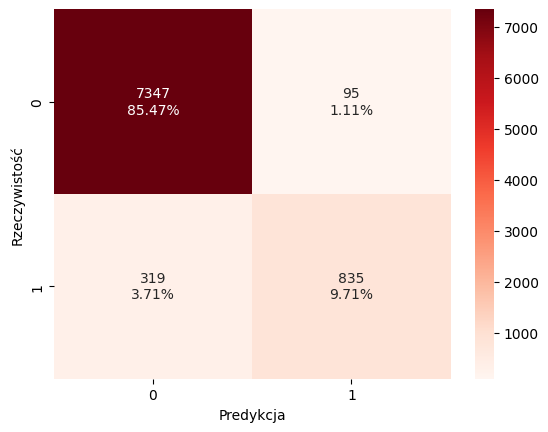

In [46]:
summary_model(rf_monthly_avg_3_july2023, X_train, y_train, ['0','1'])

In [47]:
print_classification_report(rf_monthly_avg_3_july2023, X_train, y_train)

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      7442
           1       0.90      0.72      0.80      1154

    accuracy                           0.95      8596
   macro avg       0.93      0.86      0.89      8596
weighted avg       0.95      0.95      0.95      8596



In [48]:
show_metrics(rf_monthly_avg_3_july2023, X_train, y_train)

Dokładność (accuracy): 95.18%
Precyzja (precision): 89.78%
Czułość (recall): 72.36%
F1-score: 80.13%


##### Ocena na zbiorze testowym

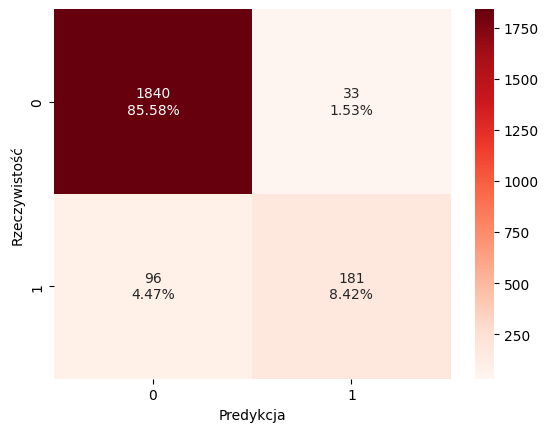

In [49]:
summary_model(rf_monthly_avg_3_july2023, X_test, y_test, ['0', '1'])

In [50]:
print_classification_report(rf_monthly_avg_3_july2023, X_test, y_test)

              precision    recall  f1-score   support

           0       0.95      0.98      0.97      1873
           1       0.85      0.65      0.74       277

    accuracy                           0.94      2150
   macro avg       0.90      0.82      0.85      2150
weighted avg       0.94      0.94      0.94      2150



In [51]:
show_metrics(rf_monthly_avg_3_july2023, X_test, y_test)

Dokładność (accuracy): 94.00%
Precyzja (precision): 84.58%
Czułość (recall): 65.34%
F1-score: 73.73%


##### Próba treningu na zbalansowanym datasecie

In [52]:
X_train_bal, y_train_bal = BalanceDataSet(X_train, y_train).useSMOTE()

In [53]:
rf_monthly_avg_3_july2023_bal = RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70, random_state=3)

In [54]:
rf_monthly_avg_3_july2023_bal.fit(X_train_bal, y_train_bal)

RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70,
                       random_state=3)

In [55]:
print_classification_report(rf_monthly_avg_3_july2023_bal, X_train_bal, y_train_bal)

              precision    recall  f1-score   support

           0       0.98      0.91      0.94      7442
           1       0.91      0.98      0.95      7442

    accuracy                           0.94     14884
   macro avg       0.95      0.94      0.94     14884
weighted avg       0.95      0.94      0.94     14884



In [56]:
show_metrics(rf_monthly_avg_3_july2023_bal, X_train_bal, y_train_bal)

Dokładność (accuracy): 94.47%
Precyzja (precision): 91.36%
Czułość (recall): 98.23%
F1-score: 94.67%


In [57]:
print_classification_report(rf_monthly_avg_3_july2023_bal, X_test, y_test)

              precision    recall  f1-score   support

           0       0.99      0.89      0.94      1873
           1       0.56      0.93      0.70       277

    accuracy                           0.90      2150
   macro avg       0.78      0.91      0.82      2150
weighted avg       0.93      0.90      0.91      2150



In [58]:
show_metrics(rf_monthly_avg_3_july2023_bal, X_test, y_test)

Dokładność (accuracy): 89.86%
Precyzja (precision): 56.48%
Czułość (recall): 92.78%
F1-score: 70.22%


W tym wypadku model gorzej radzi sobie na zbiorze testowym.

### Średnie 4-letnie

In [59]:
X = monthly_avg_4_july2023_an_merge.drop(columns=['lon', 'lat', 'pustynia'])
y = monthly_avg_4_july2023_an_merge['pustynia']

In [60]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [61]:
rf_monthly_avg_4_july2023 = RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70, random_state=3)

In [62]:
rf_monthly_avg_4_july2023.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70,
                       random_state=3)

Zastosujmy model na pełnych danych:

In [63]:
monthly_avg_4_july2023_pred = monthly_avg_4_july2023.copy()
monthly_avg_4_july2023_pred['pustynia'] = rf_monthly_avg_4_july2023.predict(monthly_avg_4_july2023.loc[:, [col for col in monthly_avg_4_july2023.columns if col.startswith('monthly_avg')]])

In [64]:
output_notebook()
show(plot_map(df=monthly_avg_4_july2023_pred, parameter_name='pustynia',
              colormap=dict(zip(['1', '0'], ['yellow', 'green'])),
              title='Pustynie (1) i niepustynie (0) - las losowy (lipiec 2023, średnia 4-letnia)',
              point_size=3, alpha=0.7))

/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)


##### Ocena na zbiorze treningowym

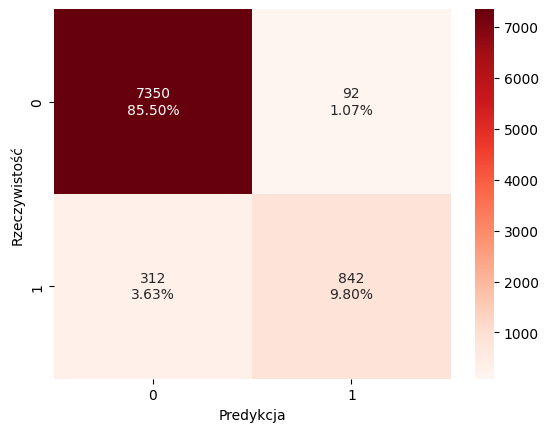

In [65]:
summary_model(rf_monthly_avg_4_july2023, X_train, y_train, ['0','1'])

In [66]:
print_classification_report(rf_monthly_avg_4_july2023, X_train, y_train)

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      7442
           1       0.90      0.73      0.81      1154

    accuracy                           0.95      8596
   macro avg       0.93      0.86      0.89      8596
weighted avg       0.95      0.95      0.95      8596



In [67]:
show_metrics(rf_monthly_avg_4_july2023, X_train, y_train)

Dokładność (accuracy): 95.30%
Precyzja (precision): 90.15%
Czułość (recall): 72.96%
F1-score: 80.65%


##### Ocena na zbiorze testowym

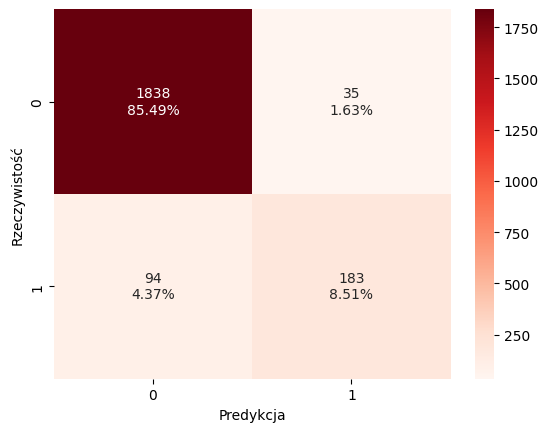

In [68]:
summary_model(rf_monthly_avg_4_july2023, X_test, y_test, ['0', '1'])

In [69]:
print_classification_report(rf_monthly_avg_4_july2023, X_test, y_test)

              precision    recall  f1-score   support

           0       0.95      0.98      0.97      1873
           1       0.84      0.66      0.74       277

    accuracy                           0.94      2150
   macro avg       0.90      0.82      0.85      2150
weighted avg       0.94      0.94      0.94      2150



In [70]:
show_metrics(rf_monthly_avg_4_july2023, X_test, y_test)

Dokładność (accuracy): 94.00%
Precyzja (precision): 83.94%
Czułość (recall): 66.06%
F1-score: 73.94%


### Średnie 5-letnie

In [71]:
X = monthly_avg_5_july2023_an_merge.drop(columns=['lon', 'lat', 'pustynia'])
y = monthly_avg_5_july2023_an_merge['pustynia']

In [72]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [73]:
rf_monthly_avg_5_july2023 = RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70, random_state=3)

In [74]:
rf_monthly_avg_5_july2023.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, min_samples_leaf=4, n_estimators=70,
                       random_state=3)

Zastosujmy model na pełnych danych:

In [75]:
monthly_avg_5_july2023_pred = monthly_avg_5_july2023.copy()
monthly_avg_5_july2023_pred['pustynia'] = rf_monthly_avg_5_july2023.predict(monthly_avg_5_july2023.loc[:, [col for col in monthly_avg_5_july2023.columns if col.startswith('monthly_avg')]])

In [76]:
output_notebook()
show(plot_map(df=monthly_avg_5_july2023_pred, parameter_name='pustynia',
              colormap=dict(zip(['1', '0'], ['yellow', 'green'])),
              title='Pustynie (1) i niepustynie (0) - las losowy (lipiec 2023, średnia 5-letnia)',
              point_size=3, alpha=0.7))

/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)


##### Ocena na zbiorze treningowym

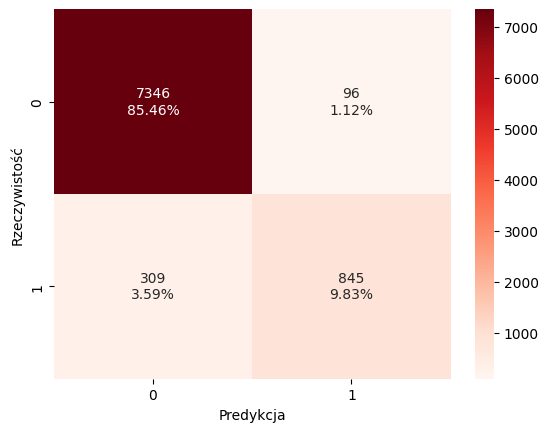

In [77]:
summary_model(rf_monthly_avg_5_july2023, X_train, y_train, ['0','1'])

In [78]:
print_classification_report(rf_monthly_avg_5_july2023, X_train, y_train)

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      7442
           1       0.90      0.73      0.81      1154

    accuracy                           0.95      8596
   macro avg       0.93      0.86      0.89      8596
weighted avg       0.95      0.95      0.95      8596



In [79]:
show_metrics(rf_monthly_avg_5_july2023, X_train, y_train)

Dokładność (accuracy): 95.29%
Precyzja (precision): 89.80%
Czułość (recall): 73.22%
F1-score: 80.67%


##### Ocena na zbiorze testowym

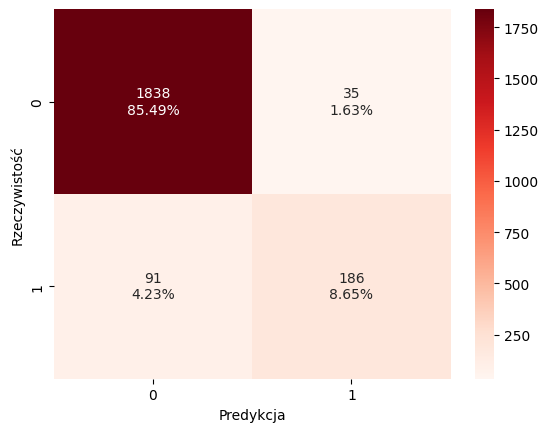

In [80]:
summary_model(rf_monthly_avg_5_july2023, X_test, y_test, ['0', '1'])

In [81]:
print_classification_report(rf_monthly_avg_5_july2023, X_test, y_test)

              precision    recall  f1-score   support

           0       0.95      0.98      0.97      1873
           1       0.84      0.67      0.75       277

    accuracy                           0.94      2150
   macro avg       0.90      0.83      0.86      2150
weighted avg       0.94      0.94      0.94      2150



In [82]:
show_metrics(rf_monthly_avg_5_july2023, X_test, y_test)

Dokładność (accuracy): 94.14%
Precyzja (precision): 84.16%
Czułość (recall): 67.15%
F1-score: 74.70%


## Wnioski

Wszystkie trzy modele na zbiorze testowym wypadają niemalże identycznie. Gdyby już musieć wybrać najlepszy model to byłby to model wytrenowany na 5-letnich średnich dla miesięcy, ale występujące w metrykach klasyfikacji różnice są zupełnie nieznaczne.

# LGBM

## Trening i test modelu przy użyciu nowych danych i zbioru anotowanego

### Średnie 3-letnie

In [ ]:
X = monthly_avg_3_july2023_an_merge.drop(columns=['lon', 'lat', 'pustynia'])
y = monthly_avg_3_july2023_an_merge['pustynia']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [ ]:
lgbm_monthly_avg_3_july2023 = lgb.LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

In [ ]:
lgbm_monthly_avg_3_july2023.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 1154, number of negative: 7442
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 8596, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.134248 -> initscore=-1.863905
[LightGBM] [Info] Start training from score -1.863905


LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

Zastosujmy model na pełnych danych:

In [ ]:
monthly_avg_3_july2023_pred_lgbm = monthly_avg_3_july2023.copy()
monthly_avg_3_july2023_pred_lgbm['pustynia'] = lgbm_monthly_avg_3_july2023.predict(monthly_avg_3_july2023.loc[:, [col for col in monthly_avg_3_july2023.columns if col.startswith('monthly_avg')]])

In [ ]:
output_notebook()
show(plot_map(df=monthly_avg_3_july2023_pred_lgbm, parameter_name='pustynia',
              colormap=dict(zip(['1', '0'], ['yellow', 'green'])),
              title='Pustynie (1) i niepustynie (0) - LGBM (lipiec 2023, średnia 3-letnia)',
              point_size=3, alpha=0.7))

##### Ocena na zbiorze treningowym

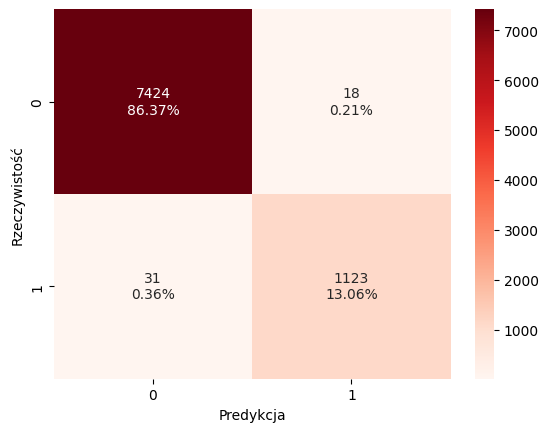

In [ ]:
summary_model(lgbm_monthly_avg_3_july2023, X_train, y_train, ['0','1'])

In [ ]:
print_classification_report(lgbm_monthly_avg_3_july2023, X_train, y_train)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7442
           1       0.98      0.97      0.98      1154

    accuracy                           0.99      8596
   macro avg       0.99      0.99      0.99      8596
weighted avg       0.99      0.99      0.99      8596



In [ ]:
show_metrics(lgbm_monthly_avg_3_july2023, X_train, y_train)

Dokładność (accuracy): 99.43%
Precyzja (precision): 98.42%
Czułość (recall): 97.31%
F1-score: 97.86%


##### Ocena na zbiorze testowym

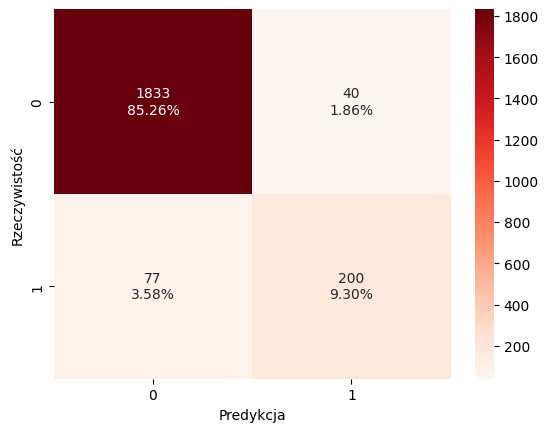

In [ ]:
summary_model(lgbm_monthly_avg_3_july2023, X_test, y_test, ['0', '1'])

In [ ]:
print_classification_report(lgbm_monthly_avg_3_july2023, X_test, y_test)

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1873
           1       0.83      0.72      0.77       277

    accuracy                           0.95      2150
   macro avg       0.90      0.85      0.87      2150
weighted avg       0.94      0.95      0.94      2150



In [ ]:
show_metrics(lgbm_monthly_avg_3_july2023, X_test, y_test)

Dokładność (accuracy): 94.56%
Precyzja (precision): 83.33%
Czułość (recall): 72.20%
F1-score: 77.37%


##### Próba treningu na zbalansowanym datasecie

In [ ]:
X_train_bal, y_train_bal = BalanceDataSet(X_train, y_train).useSMOTE()

In [ ]:
lgbm_monthly_avg_3_july2023_bal = lgb.LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

In [ ]:
lgbm_monthly_avg_3_july2023_bal.fit(X_train_bal, y_train_bal)

[LightGBM] [Info] Number of positive: 7442, number of negative: 7442
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 14884, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

In [ ]:
print_classification_report(lgbm_monthly_avg_3_july2023_bal, X_train_bal, y_train_bal)

              precision    recall  f1-score   support

           0       1.00      0.97      0.98      7442
           1       0.97      1.00      0.98      7442

    accuracy                           0.98     14884
   macro avg       0.98      0.98      0.98     14884
weighted avg       0.98      0.98      0.98     14884



In [ ]:
show_metrics(lgbm_monthly_avg_3_july2023_bal, X_train_bal, y_train_bal)

Dokładność (accuracy): 98.11%
Precyzja (precision): 96.69%
Czułość (recall): 99.62%
F1-score: 98.13%


In [ ]:
print_classification_report(lgbm_monthly_avg_3_july2023_bal, X_test, y_test)

              precision    recall  f1-score   support

           0       0.99      0.93      0.96      1873
           1       0.65      0.91      0.76       277

    accuracy                           0.93      2150
   macro avg       0.82      0.92      0.86      2150
weighted avg       0.94      0.93      0.93      2150



In [ ]:
show_metrics(lgbm_monthly_avg_3_july2023_bal, X_test, y_test)

Dokładność (accuracy): 92.60%
Precyzja (precision): 65.21%
Czułość (recall): 91.34%
F1-score: 76.09%


W tym wypadku model gorzej radzi sobie na zbiorze testowym.

### Średnie 4-letnie

In [ ]:
X = monthly_avg_4_july2023_an_merge.drop(columns=['lon', 'lat', 'pustynia'])
y = monthly_avg_4_july2023_an_merge['pustynia']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [ ]:
lgbm_monthly_avg_4_july2023 = lgb.LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

In [ ]:
lgbm_monthly_avg_4_july2023.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 1154, number of negative: 7442
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 8596, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.134248 -> initscore=-1.863905
[LightGBM] [Info] Start training from score -1.863905


LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

Zastosujmy model na pełnych danych:

In [ ]:
monthly_avg_4_july2023_pred_lgbm = monthly_avg_4_july2023.copy()
monthly_avg_4_july2023_pred_lgbm['pustynia'] = lgbm_monthly_avg_4_july2023.predict(monthly_avg_4_july2023.loc[:, [col for col in monthly_avg_4_july2023.columns if col.startswith('monthly_avg')]])

In [ ]:
output_notebook()
show(plot_map(df=monthly_avg_4_july2023_pred_lgbm, parameter_name='pustynia',
              colormap=dict(zip(['1', '0'], ['yellow', 'green'])),
              title='Pustynie (1) i niepustynie (0) - LGBM (lipiec 2023, średnia 4-letnia)',
              point_size=3, alpha=0.7))

##### Ocena na zbiorze treningowym

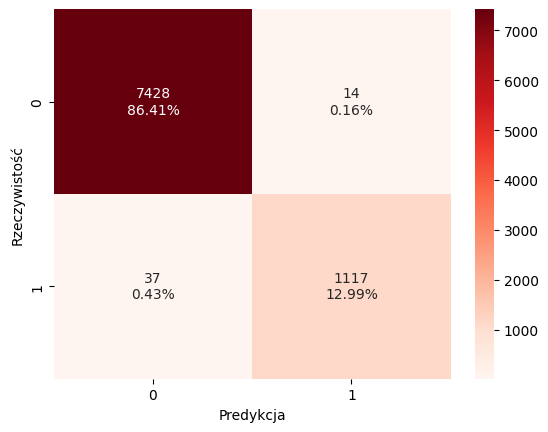

In [ ]:
summary_model(lgbm_monthly_avg_4_july2023, X_train, y_train, ['0','1'])

In [ ]:
print_classification_report(lgbm_monthly_avg_4_july2023, X_train, y_train)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7442
           1       0.99      0.97      0.98      1154

    accuracy                           0.99      8596
   macro avg       0.99      0.98      0.99      8596
weighted avg       0.99      0.99      0.99      8596



In [ ]:
show_metrics(lgbm_monthly_avg_4_july2023, X_train, y_train)

Dokładność (accuracy): 99.41%
Precyzja (precision): 98.76%
Czułość (recall): 96.79%
F1-score: 97.77%


##### Ocena na zbiorze testowym

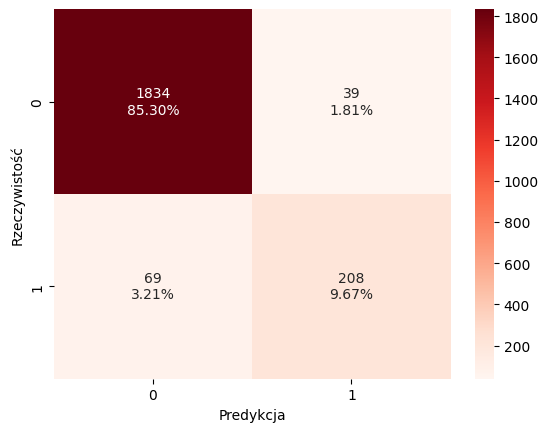

In [ ]:
summary_model(lgbm_monthly_avg_4_july2023, X_test, y_test, ['0', '1'])

In [ ]:
print_classification_report(lgbm_monthly_avg_4_july2023, X_test, y_test)

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1873
           1       0.84      0.75      0.79       277

    accuracy                           0.95      2150
   macro avg       0.90      0.87      0.88      2150
weighted avg       0.95      0.95      0.95      2150



In [ ]:
show_metrics(lgbm_monthly_avg_4_july2023, X_test, y_test)

Dokładność (accuracy): 94.98%
Precyzja (precision): 84.21%
Czułość (recall): 75.09%
F1-score: 79.39%


### Średnie 5-letnie

In [ ]:
X = monthly_avg_5_july2023_an_merge.drop(columns=['lon', 'lat', 'pustynia'])
y = monthly_avg_5_july2023_an_merge['pustynia']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [ ]:
lgbm_monthly_avg_5_july2023 = lgb.LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

In [ ]:
lgbm_monthly_avg_5_july2023.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 1154, number of negative: 7442
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 8596, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.134248 -> initscore=-1.863905
[LightGBM] [Info] Start training from score -1.863905


LGBMClassifier(max_depth=10, n_estimators=120, num_leaves=30, random_state=3)

Zastosujmy model na pełnych danych:

In [ ]:
monthly_avg_5_july2023_pred_lgbm = monthly_avg_5_july2023.copy()
monthly_avg_5_july2023_pred_lgbm['pustynia'] = lgbm_monthly_avg_5_july2023.predict(monthly_avg_5_july2023.loc[:, [col for col in monthly_avg_5_july2023.columns if col.startswith('monthly_avg')]])

In [ ]:
output_notebook()
show(plot_map(df=monthly_avg_5_july2023_pred_lgbm, parameter_name='pustynia',
              colormap=dict(zip(['1', '0'], ['yellow', 'green'])),
              title='Pustynie (1) i niepustynie (0) - LGBM (lipiec 2023, średnia 5-letnia)',
              point_size=3, alpha=0.7))

##### Ocena na zbiorze treningowym

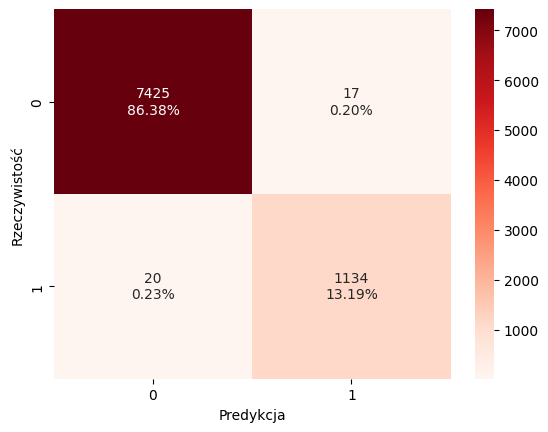

In [ ]:
summary_model(lgbm_monthly_avg_5_july2023, X_train, y_train, ['0','1'])

In [ ]:
print_classification_report(lgbm_monthly_avg_5_july2023, X_train, y_train)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7442
           1       0.99      0.98      0.98      1154

    accuracy                           1.00      8596
   macro avg       0.99      0.99      0.99      8596
weighted avg       1.00      1.00      1.00      8596



In [ ]:
show_metrics(lgbm_monthly_avg_5_july2023, X_train, y_train)

Dokładność (accuracy): 99.57%
Precyzja (precision): 98.52%
Czułość (recall): 98.27%
F1-score: 98.39%


##### Ocena na zbiorze testowym

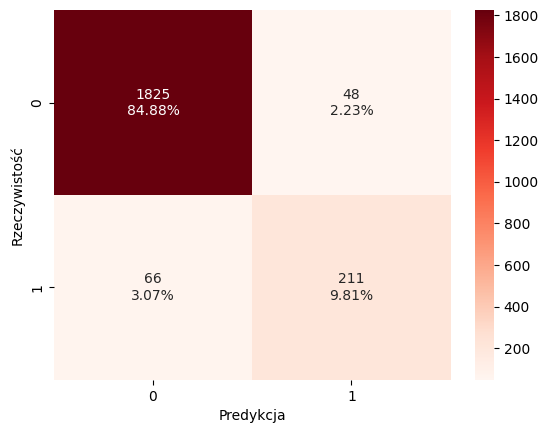

In [ ]:
summary_model(lgbm_monthly_avg_5_july2023, X_test, y_test, ['0', '1'])

In [ ]:
print_classification_report(lgbm_monthly_avg_5_july2023, X_test, y_test)

              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1873
           1       0.81      0.76      0.79       277

    accuracy                           0.95      2150
   macro avg       0.89      0.87      0.88      2150
weighted avg       0.95      0.95      0.95      2150



In [ ]:
show_metrics(lgbm_monthly_avg_5_july2023, X_test, y_test)

Dokładność (accuracy): 94.70%
Precyzja (precision): 81.47%
Czułość (recall): 76.17%
F1-score: 78.73%


## Wnioski

Otrzymane modele są lepsze niż wytrenowane wcześniej lasy losowe. Zarówno dla danych treningowych, jak i testowych otrzymujemy lepsze wyniki. Ogólnie, wszystkie trzy modele na zbiorze testowym wypadają bardzo podobnie do siebie. Model wytrenowany na 5-letnich średnich dla miesięcy wydaje się być najmniej precyzyjny, w tym wypadku najlepszy wynik mamy dla 4-letnich średnich. Podsumowując wszystkie metryki klasyfikacji, najlepszym modelem jest model ze średnimi 4-letnimi.